In [1]:
import os
os.chdir('/data/l989o/deployed/a')
import sys
if '/data/l989o/a' in sys.path:
    sys.path.remove('/data/l989o/a')

In [2]:
import scanpy as sc
import anndata as ad

In [3]:
from data import TransformedMeanDataset
from tqdm import tqdm
ds_train = TransformedMeanDataset('train')
ds_validation = TransformedMeanDataset('validation')
ds_test = TransformedMeanDataset('test')
from jupy import *

True
<KeysViewHDF5 ['count', 'maximum', 'mean', 'sum', 'variance']>


In [4]:
import torch
list_of_t = []
list_of_patient_index = []
for i, t in enumerate(tqdm(ds_train)):
    list_of_t.append(t)
    ii = torch.tensor([i] * len(t))
    list_of_patient_index.append(ii)
t_train = torch.cat(list_of_t, dim=0)
patient_indexes = torch.cat(list_of_patient_index)
print(t_train.shape)

100%|██████████| 226/226 [00:02<00:00, 111.90it/s]

torch.Size([449434, 39])


In [5]:
from data import RawMeanDataset, RawMean12, NatureBImproved, NatureBOriginal, TransformedMeanDataset
from data2 import CellDataset
import functools

class A:
    def __init__(self, model, model_id):
        self.model = model
        self.model_id = model_id
        self.instance = model + '_' + model_id
        if self.model_id == 'raw_mean_dataset':
            self.dataset = RawMeanDataset
        elif self.model_id == 'raw_mean12':
            self.dataset = RawMean12
        elif self.model_id == 'nature_b_improved':
            self.dataset = NatureBImproved
        elif self.model_id == 'nature_b_original':
            self.dataset = NatureBOriginal
        elif self.model_id.startswith('transformed_mean_dataset'):
            self.dataset = TransformedMeanDataset
        elif self.model_id.startswith('cell_dataset_expression'):
            d = {'expression': True, 'center': False, 'ome': False, 'mask': False}
            self.dataset = functools.partial(CellDataset, features=d)
        else:
            raise ValueError(self.instance)
        self.ds_train = self.dataset('train')
        self.ds_validation = self.dataset('validation')

instances = [A('vae', 'raw_mean12'), A('vae', 'transformed_mean_dataset'), A('vae', 'transformed_mean_dataset_LR_VB_S_0.0014685885989200848__3.8608662714605464e-08__False')]
new_instances = [A('vae', 'cell_dataset_expression_LR_VB_S_0.008589699868666383__4.936238801267489e-08__False'), 
                 A('vae', 'cell_dataset_expression_LR_VB_S_0.005454608066923681__0.0011442413409550448__False')]
import h5py
from data import file_path

In [6]:
def the_path(instance, f):
    root = file_path(instance.instance)
    assert os.path.isdir(root), root
    return os.path.join(root, f)

**WARNING!** Notice that we didn't save models except for the last epoch, so the EPOCH below is artifically changed and for future models it will be better to save many checkpoints

In [7]:
from models.train_vae import Vae
import ignite.distributed as idist
from h5_logger import H5Logger
import torch
from tqdm import tqdm

for instance in instances: 
    model = Vae(in_channels=39, hidden_layer_dimensions=5, out_channels=39)
    model = model.to(idist.device())
    model.load_state_dict(torch.load(the_path(instance, 'model.torch')))
    for split in ['train', 'validation']:
        path = the_path(instance, f'embedding_{split}.hdf5')
        if os.path.isfile(path):
            os.remove(path)
        if not os.path.isfile(path):
            EPOCH = 40
            print(f'embedding not found, creating it for EPOCH = {EPOCH}, path =', path)
            embedding_training_logger = H5Logger(path)
            embedding_training_logger.clear()
            if split == 'train':
                ds = instance.ds_train
            elif split == 'validation':
                ds = instance.ds_validation
            else:
                raise ValueError()

            # only_first_5_samples = False
            with torch.no_grad():
                list_of_reconstructed = []
                list_of_mu = []
                list_of_log_var = []
                iterator = tqdm(ds, desc='embedding', position=0, leave=True)
                for i, data in enumerate(iterator):
                    data.to(idist.device())
                    data = torch.unsqueeze(data, 0)
                    # data = [torch.unsqueeze(x, 0) for x in data]
                    recon_batch, mu, log_var = model.forward_step(data, model)
                    ome_filename = ds.filenames[i]

                    def u(x):
                        if len(x.shape) == 3 and x.shape[0] == 1:
                            x = x.reshape(-1, x.shape[2])
                        return x

                    f = lambda x: x.cpu().detach().numpy()
                    # reconstructed = ome_dataset.scale_back(reconstructed.cpu().detach(), i)
                    a = f(u(recon_batch))
                    b = f(u(mu))
                    c = f(u(log_var))
                    data = {f'{ome_filename}/reconstructed': a,
                            f'{ome_filename}/mu': b,
                            f'{ome_filename}/log_var': c}
                    embedding_training_logger.log(EPOCH, data)

embedding:   0%|          | 0/226 [00:00<?, ?it/s]

embedding not found, creating it for EPOCH = 40, path = /data/l989o/deployed/a/data/spatial_uzh_processed/a/vae_raw_mean12/embedding_train.hdf5


embedding:  14%|█▍        | 16/113 [00:00<00:00, 156.48it/s]

embedding not found, creating it for EPOCH = 40, path = /data/l989o/deployed/a/data/spatial_uzh_processed/a/vae_raw_mean12/embedding_validation.hdf5


embedding:   4%|▍         | 10/226 [00:00<00:02, 93.40it/s]

embedding not found, creating it for EPOCH = 40, path = /data/l989o/deployed/a/data/spatial_uzh_processed/a/vae_transformed_mean_dataset/embedding_train.hdf5


embedding:  12%|█▏        | 13/113 [00:00<00:00, 127.09it/s]

embedding not found, creating it for EPOCH = 40, path = /data/l989o/deployed/a/data/spatial_uzh_processed/a/vae_transformed_mean_dataset/embedding_validation.hdf5


embedding:   4%|▍         | 10/226 [00:00<00:02, 93.33it/s]

embedding not found, creating it for EPOCH = 40, path = /data/l989o/deployed/a/data/spatial_uzh_processed/a/vae_transformed_mean_dataset_LR_VB_S_0.0014685885989200848__3.8608662714605464e-08__False/embedding_train.hdf5


embedding:  13%|█▎        | 15/113 [00:00<00:00, 142.41it/s]

embedding not found, creating it for EPOCH = 40, path = /data/l989o/deployed/a/data/spatial_uzh_processed/a/vae_transformed_mean_dataset_LR_VB_S_0.0014685885989200848__3.8608662714605464e-08__False/embedding_validation.hdf5


embedding: 100%|██████████| 113/113 [00:00<00:00, 143.08it/s]


In [8]:
raw_train = RawMeanDataset('train')
counts = [(len(a), i) for i, a in enumerate(raw_train)]
counts = sorted(counts, key=lambda x: x[0])
train_sort = np.array([c[1] for c in counts])

raw_val = RawMeanDataset('validation')
counts = [(len(a), i) for i, a in enumerate(raw_val)]
counts = sorted(counts, key=lambda x: x[0])
val_sort = np.array([c[1] for c in counts])

In [9]:
f = file_path('vae_transformed_mean_dataset_LR_VB_S_0.0014685885989200848__3.8608662714605464e-08__False/embedding_validation.hdf5')
assert os.path.isfile(f)
with h5py.File(f, 'r') as f5:
    print(f5.keys())

<KeysViewHDF5 ['epoch40']>


In [10]:
from scipy.stats import spearmanr
import numpy as np

all_k = set()
for instance in instances:
    print(instance.instance, 'train')
    f = the_path(instance, 'embedding_train.hdf5')
    with h5py.File(f, 'r') as f5:
#         assert len(f5.keys()) == 1
        k = None
        v = None
        for k, v in f5.items():
            print('scanning the k values (last is used):', k)
        if len(all_k) == 0:
            bbb = True
        all_k.add(k)
        assert len(all_k) <= 1, all_k
        if bbb:
            print(f'EPOCH {k}', flush=True)
            
        o_train = instance.ds_train.filenames        
        spearman_train_list = []
        for i, o in enumerate(tqdm(o_train, desc='spearamn train')):
            original = instance.ds_train[i].numpy()
            reconstructed = v[o]['reconstructed'][...]
            assert original.shape == reconstructed.shape
            correlations = []
            for c in range(39):
                x = original[:, c]
                y = reconstructed[:, c]
                r, p_value = spearmanr(x, y)
                correlations.append(r)
            corr = np.array(correlations).reshape((1, -1))
            spearman_train_list.append(corr)
        spearman_train = np.concatenate(spearman_train_list, axis=0)
        instance.spearman_train = spearman_train
        
    print(instance.instance, 'validation')
    f = the_path(instance, 'embedding_validation.hdf5')
    with h5py.File(f, 'r') as f5:
#         assert len(f5.keys()) == 1
#         k, v = f5.items().__iter__().__next__()
        k = None
        v = None
        for k, v in f5.items():
            print('scanning the k values (last is used):', k)
        if len(all_k) == 0:
            bbb = True
        print('k = ', k)
        print('all_k =', all_k, flush=True)
        all_k.add(k)
        assert len(all_k) <= 1, all_k
        if bbb:
            print(f'EPOCH {k}', flush=True)
            
        o_validation = instance.ds_validation.filenames        
        spearman_validation_list = []
        for i, o in enumerate(tqdm(o_validation, desc='spearamn validation')):
            original = instance.ds_validation[i].numpy()
            reconstructed = v[o]['reconstructed'][...]
            assert original.shape == reconstructed.shape
            correlations = []
            for c in range(39):
                x = original[:, c]
                y = reconstructed[:, c]
                r, p_value = spearmanr(x, y)
                correlations.append(r)
            corr = np.array(correlations).reshape((1, -1))
            spearman_validation_list.append(corr)
        spearman_validation = np.concatenate(spearman_validation_list, axis=0)
        instance.spearman_validation = spearman_validation
    print()

vae_raw_mean12 train
scanning the k values (last is used): epoch40
EPOCH epoch40


spearamn train: 100%|██████████| 226/226 [00:08<00:00, 27.28it/s]

vae_raw_mean12 validation
scanning the k values (last is used): epoch40
k =  epoch40
all_k = {'epoch40'}
EPOCH epoch40



spearamn validation: 100%|██████████| 113/113 [00:03<00:00, 30.96it/s]



vae_transformed_mean_dataset train
scanning the k values (last is used): epoch40
EPOCH epoch40


spearamn train: 100%|██████████| 226/226 [00:08<00:00, 27.70it/s]

vae_transformed_mean_dataset validation
scanning the k values (last is used): epoch40
k =  epoch40
all_k = {'epoch40'}
EPOCH epoch40



spearamn validation: 100%|██████████| 113/113 [00:03<00:00, 30.62it/s]


vae_transformed_mean_dataset_LR_VB_S_0.0014685885989200848__3.8608662714605464e-08__False train
scanning the k values (last is used): epoch40
EPOCH epoch40



spearamn train: 100%|██████████| 226/226 [00:08<00:00, 26.66it/s]

vae_transformed_mean_dataset_LR_VB_S_0.0014685885989200848__3.8608662714605464e-08__False validation
scanning the k values (last is used): epoch40
k =  epoch40
all_k = {'epoch40'}
EPOCH epoch40



spearamn validation: 100%|██████████| 113/113 [00:03<00:00, 29.77it/s]

In [11]:
from data2 import IndexInfo
from models.ad_train_vaes_data2 import Vae
import ignite.distributed as idist
import torch
from tqdm import tqdm

for my_instance in new_instances:
    def embed_new(ii, ds):    
        model = Vae(in_channels=39, hidden_layer_dimensions=5, out_channels=39)
        model = model.to(idist.device())
        model.load_state_dict(torch.load(the_path(my_instance, 'model.torch')))

    #     path = the_path(new_instance, f'embedding_{split}.hdf5')
    #     EPOCH = 40
    #     print(f'embedding not found, creating it for EPOCH = {EPOCH}, path =', path, flush=True)
    #     embedding_training_logger = H5Logger(path)
    #     embedding_training_logger.clear()
        list_of_original = []
        list_of_reconstructed = []
        list_of_mu = []
        list_of_log_var = []
        list_of_correlations = []

        for i, ome_filename in enumerate(tqdm(ii.filenames)):
            begin = ii.filtered_begins[i]
            end = ii.filtered_ends[i]
            x = np.concatenate(ds[begin: end], axis=0)

            with torch.no_grad():
                data = torch.from_numpy(x)
                data.to(idist.device())
                data = torch.unsqueeze(data, 0)
                recon_batch, mu, log_var = model.forward_step([data], model)

                def u(xx):
                    if len(xx.shape) == 3 and xx.shape[0] == 1:
                        xx = xx.reshape(-1, xx.shape[2])
                    return xx

                f = lambda xx: xx.cpu().detach().numpy()
                # reconstructed = ome_dataset.scale_back(reconstructed.cpu().detach(), i)
                a = f(u(recon_batch))
                b = f(u(mu))
                c = f(u(log_var))
                data = {f'{ome_filename}/reconstructed': a,
                        f'{ome_filename}/mu': b,
                        f'{ome_filename}/log_var': c}
    #             embedding_training_logger.log(EPOCH, data)

            original = x
            reconstructed = a
            assert original.shape == reconstructed.shape
            correlations = []
            for cc in range(39):
                xx = original[:, cc]
                y = reconstructed[:, cc]
                r, p_value = spearmanr(xx, y)
                correlations.append(r)
            corr = np.array(correlations).reshape((1, -1))
            list_of_correlations.append(corr)
            list_of_original.append(x)
            list_of_mu.append(b)
            list_of_log_var.append(c)

        all_correlations = np.concatenate(list_of_correlations, axis=0)
        all_original = np.concatenate(list_of_original, axis=0)
        all_mu = np.concatenate(list_of_mu, axis=0)
        all_log_var = np.concatenate(list_of_log_var, axis=0)
        return all_correlations, all_original, all_mu, all_log_var

    correlations_train, all_original_train, all_mu_train, all_log_var_train = embed_new(IndexInfo('train'), my_instance.ds_train)
    correlations_validation, _, _, _ = embed_new(IndexInfo('validation'), my_instance.ds_validation)
    # len(new_instance.ds_validation)
    print(correlations_train.shape)
    print(correlations_validation.shape)

    my_instance.spearman_train = correlations_train
    my_instance.spearman_validation = correlations_validation
    my_instance.all_original = all_original_train
    my_instance.all_mu = all_mu_train
    my_instance.all_log_var = all_log_var_train

100%|██████████| 113/113 [00:03<00:00, 37.34it/s]


(226, 39)
(113, 39)


100%|██████████| 113/113 [00:03<00:00, 37.35it/s]

(226, 39)
(113, 39)


In [12]:
for i in new_instances:
    if i in instances:
        instances.remove(i)
instances.extend(new_instances)

In [13]:
for i in instances:
    print(dir(i))

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'dataset', 'ds_train', 'ds_validation', 'instance', 'model', 'model_id', 'spearman_train', 'spearman_validation']
['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'dataset', 'ds_train', 'ds_validation', 'instance', 'model', 'model_id', 'spearman_train', 'spearman_validation']
['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format

(113, 39)


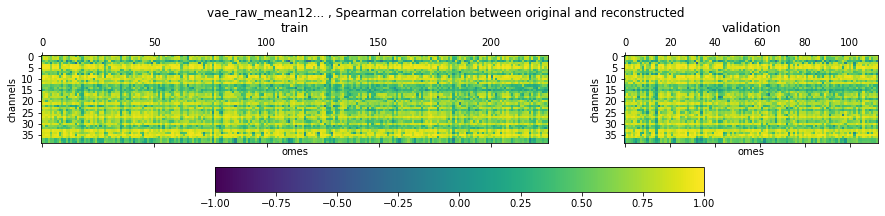

(113, 39)


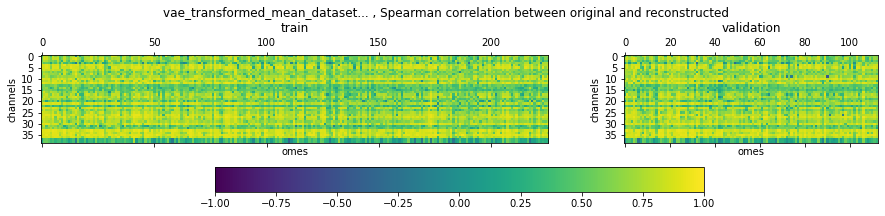

(113, 39)


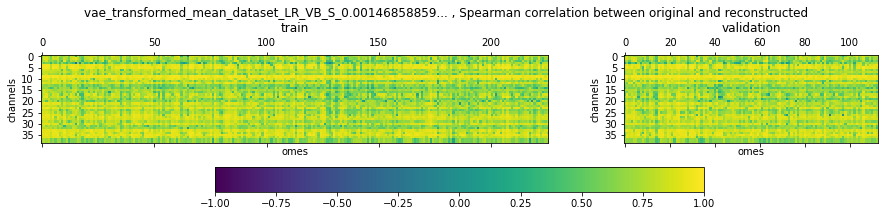

(113, 39)


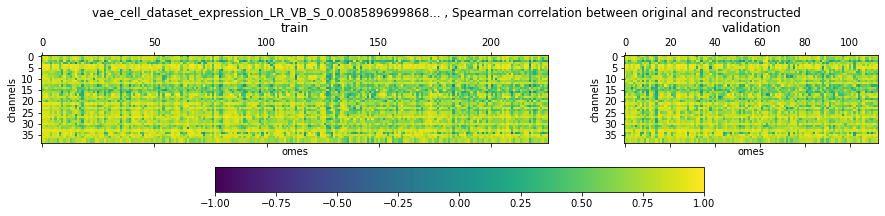

(113, 39)


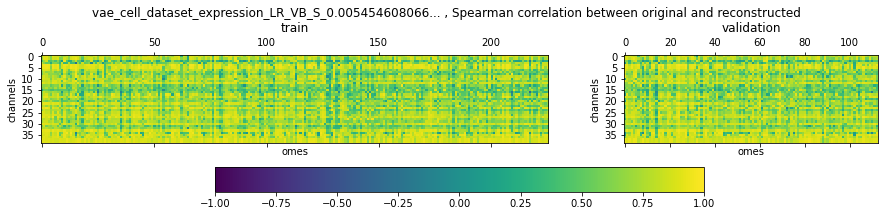

In [14]:
import matplotlib.pyplot as plt
import matplotlib

for instance in instances:
    print(instance.spearman_validation.shape)
    a = len(instance.spearman_train)
    b = len(instance.spearman_validation)
    
    fig = plt.figure(figsize=(15, 3)) # constrained_layout=True, 
#     fig.suptitle(instance.instance)
    gs = fig.add_gridspec(ncols=2, nrows=1, width_ratios=(a, b))
    ax0_0 = fig.add_subplot(gs[0, 0])
#     plt.subplot(1, 2, 1)
    plt.matshow(instance.spearman_train[train_sort, :].transpose(), interpolation='nearest', fignum=False)
    plt.clim(-1, 1)
    plt.title(f'train')
    plt.xlabel('omes')
    plt.ylabel('channels')

#     plt.subplot(1, 2, 2)
    ax0_1 = fig.add_subplot(gs[0, 1])
    pcm = plt.matshow(instance.spearman_validation[val_sort, :].transpose(), interpolation='nearest', fignum=False)
    plt.clim(-1, 1)
    plt.title(f'validation')
    plt.xlabel('omes')
    plt.ylabel('channels')
    
    fig.colorbar(pcm, ax=[ax0_0, ax0_1], location='bottom')
        
    plt.suptitle(f'{instance.instance[:50]}... , Spearman correlation between original and reconstructed')
#     plt.tight_layout()
#     gs.tight_layout(fig)
#     gs.update(top=0.95)
#     x = 0.05
#     plt.subplots_adjust(left=x, bottom=x, right=1 - x, top=1 - x, wspace=None, hspace=0.2)
    plt.show()

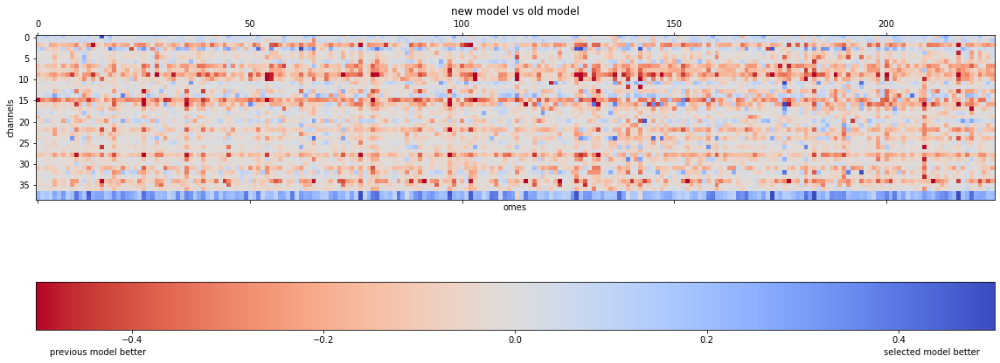

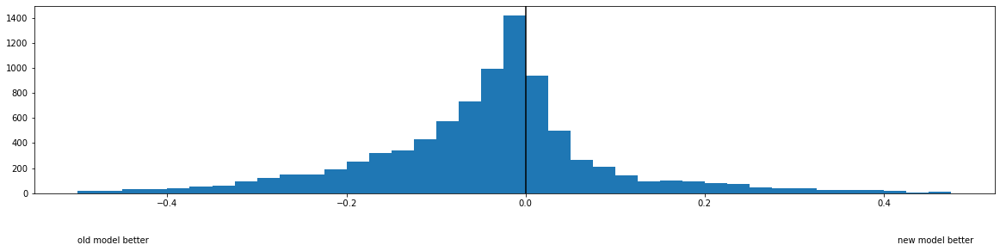

In [15]:
m = instances[-1].spearman_train[train_sort, :] - instances[2].spearman_train[train_sort, :]
plt.figure(figsize=(16, 9))
plt.matshow(m.transpose(), fignum=False, cmap='coolwarm_r')
cbar = plt.colorbar(orientation='horizontal')
cbar.set_label('previous model better' + ' ' * 270 + 'selected model better')
plt.xlabel('omes')
plt.ylabel('channels')
plt.title('new model vs old model')
plt.clim(-0.5, 0.5)
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 4))
plt.hist(m.flatten(), bins=np.arange(-0.5, 0.5, 0.025))
# plt.yscale('log')
plt.axvline(x=0, c='k')
plt.text(-0.5, -400, 'old model better', horizontalalignment='left')
plt.text(0.5, -400, 'new model better', horizontalalignment='right')
plt.show()

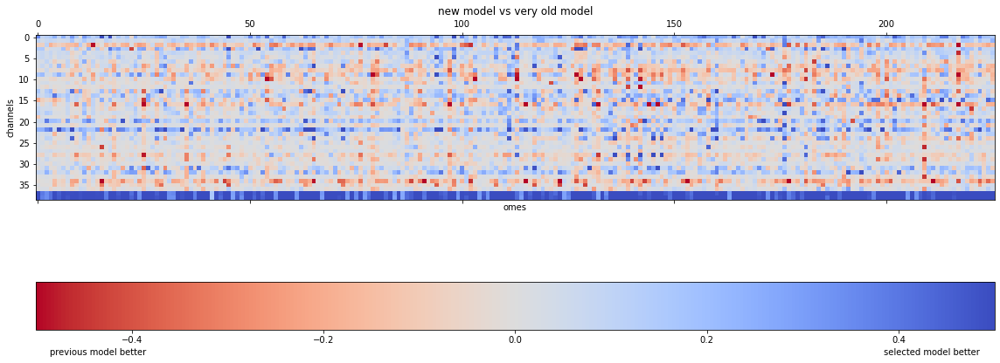

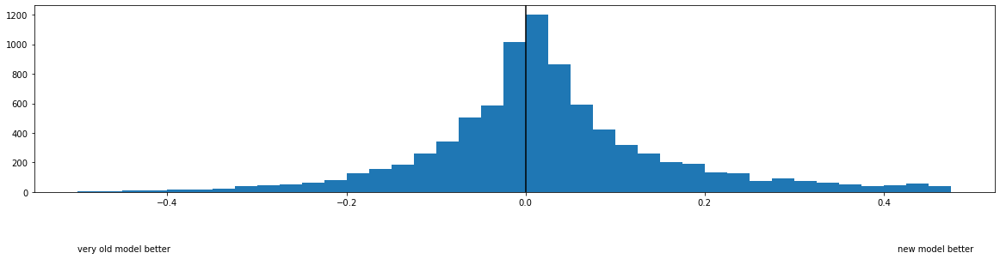

In [16]:
m = instances[-1].spearman_train[train_sort, :] - instances[1].spearman_train[train_sort, :]
plt.figure(figsize=(16, 9))
plt.matshow(m.transpose(), fignum=False, cmap='coolwarm_r')
cbar = plt.colorbar(orientation='horizontal')
cbar.set_label('previous model better' + ' ' * 270 + 'selected model better')
plt.xlabel('omes')
plt.ylabel('channels')
plt.title('new model vs very old model')
plt.clim(-0.5, 0.5)
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 4))
plt.hist(m.flatten(), bins=np.arange(-0.5, 0.5, 0.025))
# plt.yscale('log')
plt.axvline(x=0, c='k')
plt.text(-0.5, -400, 'very old model better', horizontalalignment='left')
plt.text(0.5, -400, 'new model better', horizontalalignment='right')
plt.show()

100%|██████████| 39/39 [00:01<00:00, 34.29it/s]


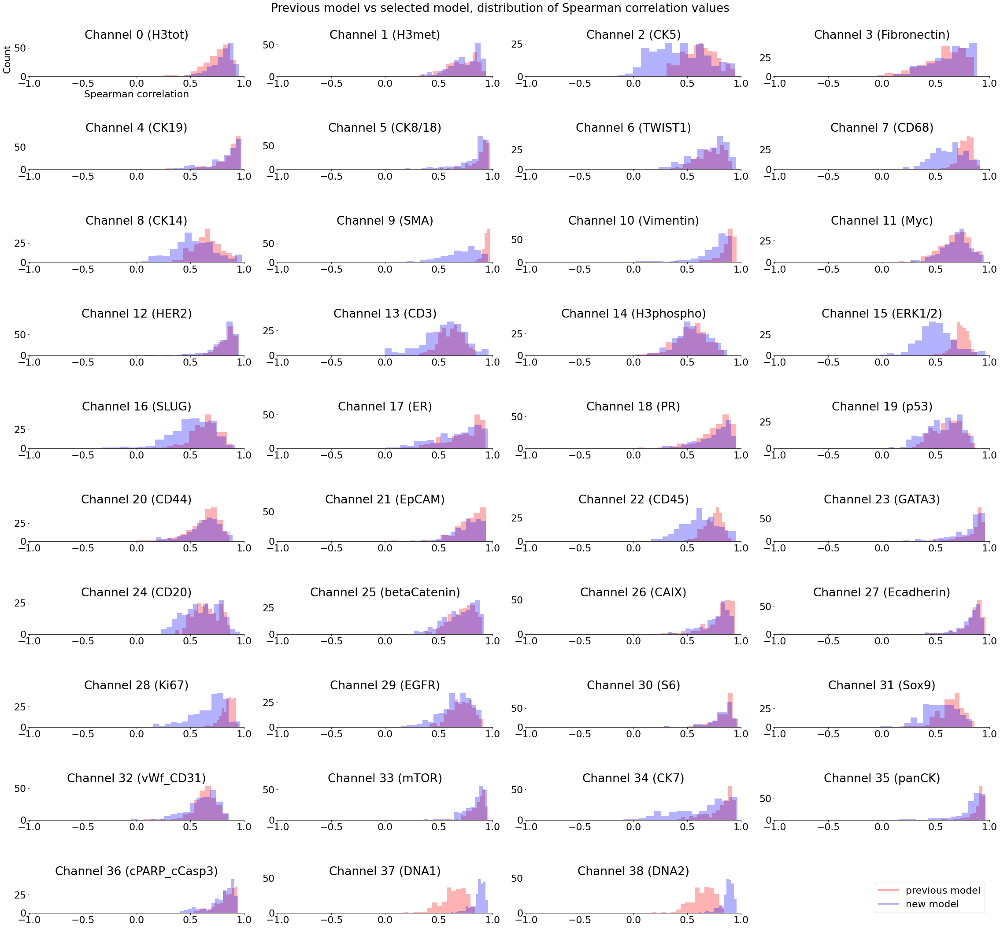

In [17]:
channel_names = ['H3tot', 'H3met', 'CK5', 'Fibronectin', 'CK19', 'CK8/18', 'TWIST1', 'CD68', 'CK14', 'SMA',
                 'Vimentin', 'Myc', 'HER2', 'CD3', 'H3phospho', 'ERK1/2', 'SLUG', 'ER', 'PR', 'p53', 'CD44',
                 'EpCAM', 'CD45', 'GATA3', 'CD20', 'betaCatenin', 'CAIX', 'Ecadherin', 'Ki67', 'EGFR', 'S6',
                 'Sox9', 'vWf_CD31', 'mTOR', 'CK7', 'panCK', 'cPARP_cCasp3', 'DNA1', 'DNA2']

n_bins = 15
fig = plt.figure(figsize=(32, 30))
import matplotlib
matplotlib.rcParams.update({'font.size': 22})
k = 1
for i in tqdm(range(39)):
    ax = plt.subplot(10, 4, k)
    k += 1
    plt.hist(instances[2].spearman_train[:, i].flatten(), bins=n_bins, color=(1., 0., 0., 0.3))
    plt.hist(instances[-1].spearman_train[:, i].flatten(), bins=n_bins, color=(0., 0., 1., 0.3))
    ax.title.set_text(f'\nChannel {i} ({channel_names[i]})')
    ax.set_xlim([-1, 1])
    if k == 2:
        ax.set_xlabel('Spearman correlation')
        ax.set_ylabel('Count')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
#     ax.grid(axis='y')

plt.subplot(10, 4, 40)
plt.axis('off')
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color=(1., 0., 0., 0.3), lw=4),
                Line2D([0], [0], color=(0., 0., 1., 0.3), lw=4)]
plt.legend(custom_lines, ['previous model', 'new model'])
# x = 0.05
# plt.subplots_adjust(left=x, bottom=x, right=1 - x, top=1 - x, wspace=None, hspace=0.3)
plt.suptitle(f'Previous model vs selected model, distribution of Spearman correlation values')
plt.tight_layout()
plt.show()
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
# plt.close(fig)

In [46]:
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

import plotly.figure_factory as ff

plt.style.use('default')

hist_data = []
group_labels = []
for instance in instances:
    v = instance.spearman_validation.flatten()
    hist_data.append(v)
    group_labels.append(instance.instance if len(instance.instance) < 50 else instance.instance[:50] + '...')
    
import pandas as pd
# let's order the boxplots by increasing mean
means = [np.mean(h) for h in hist_data]
s = np.array([x[1] for x in sorted(zip(means, range(len(means))), key=lambda x: -x[0])])
group_labels = [group_labels[i] for i in s]
hist_data = [hist_data[i] for i in s]
df = pd.DataFrame(dict(zip(group_labels, hist_data)))

In [47]:
new_columns = df.columns.to_series().apply(lambda x: x if len(x) < 50 else x[:50] + '...')
df.columns = new_columns

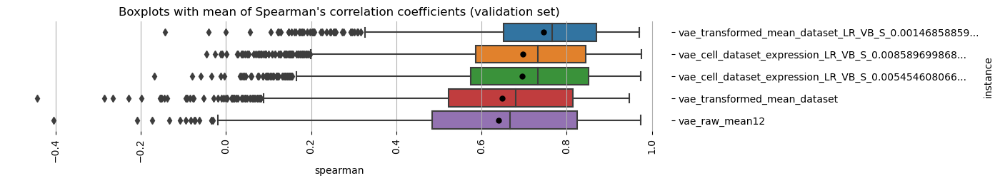

In [48]:
df = df.melt().rename(columns={'variable': 'instance', 'value': 'spearman'})
import seaborn as sns
plt.figure(figsize=(12, 2))
ax = sns.boxplot(x='spearman', y='instance', data=df, orient='h', showmeans=True,
                 meanprops={
                     'marker': 'o',
                     'markerfacecolor': 'black',
                     'markeredgecolor': 'black',
                     'markersize': '5'
                 })
plt.xticks(rotation='vertical')
ax.xaxis.grid()
ax.yaxis.set_label_position("right")
ax.yaxis.tick_right()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
plt.title('Boxplots with mean of Spearman\'s correlation coefficients (validation set)')
plt.show()

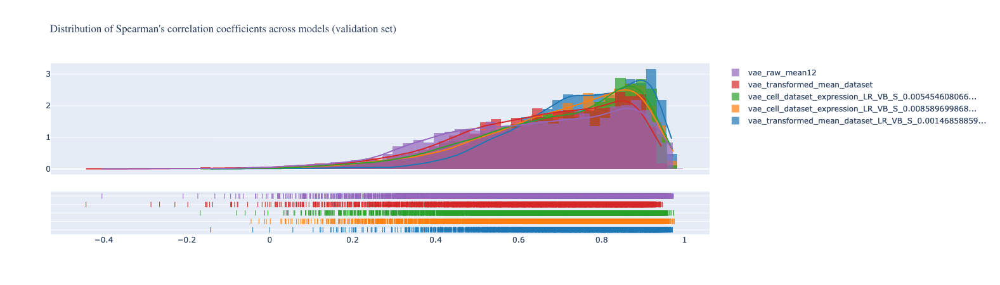

In [49]:
fig = ff.create_distplot(hist_data, group_labels, bin_size=[.025] * len(hist_data), show_rug=True)
# import plotly.express as px
# fig = px.histogram(df, x='spearman', color='instance', marginal='box')
layout = go.Layout(
    title='$\\text{Distribution of Spearman\'s correlation coefficients across models (validation set)}$',
    xaxis_title='$R^2$',
    yaxis_title='$\\text{Density estimation}$')
fig.update_layout(layout)
iplot(fig)

# Comparing the embeddings

In [22]:
import numpy as np

all_k = set()
for instance in instances:
    f = the_path(instance, 'embedding_train.hdf5')
    with h5py.File(f, 'r') as f5:
#         assert len(f5.keys()) == 1
#         k, v = f5.items().__iter__().__next__()
        k = 'epoch40'
        v = f5[k]
        if len(all_k) == 0:
            bbb = True
        all_k.add(k)
        assert len(all_k) <= 1
        if bbb:
            print(f'EPOCH {k}', flush=True)
            
        if not hasattr(instance, 'all_original'):
            o_train = instance.ds_train.filenames        
            original_list = []
            mu_list = []
            log_var_list = []
            for i, o in enumerate(tqdm(o_train, desc='spearamn train')):
                original = instance.ds_train[i].clone().detach().numpy()
                mu = v[o]['mu'][...]
                log_var = v[o]['log_var'][...]
                assert mu.shape == log_var.shape
                assert len(original) == len(mu)
                original_list.append(original)
                mu_list.append(mu)
                log_var_list.append(log_var)
            instance.mu_list = mu_list
            instance.log_var_list = log_var_list

            instance.all_original = np.concatenate(original_list, axis=0)
            instance.all_mu = np.concatenate(mu_list, axis=0)
            instance.all_log_var = np.concatenate(log_var_list, axis=0)
        else:
            assert hasattr(instance, 'all_mu')
            assert hasattr(instance, 'all_log_var')

EPOCH epoch40


spearamn train: 100%|██████████| 226/226 [00:02<00:00, 111.36it/s]


EPOCH epoch40


spearamn train: 100%|██████████| 226/226 [00:02<00:00, 106.45it/s]


EPOCH epoch40


spearamn train: 100%|██████████| 226/226 [00:02<00:00, 106.65it/s]

EPOCH epoch40
EPOCH epoch40


In [23]:
import numpy as np
random_choice = np.random.choice(len(instances[0].all_original), 10000, replace=False)

vae_transformed_mean_dataset_LR_VB_S_0.0014685885989200848__3.8608662714605464e-08__False


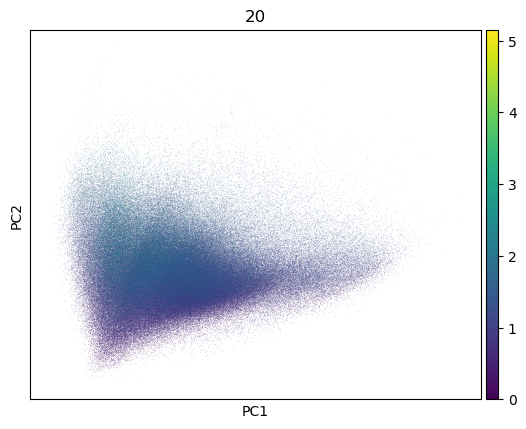

In [24]:
instance = instances[2]

print(instance.instance)
a0 = ad.AnnData(instance.all_original)
a1 = ad.AnnData(instance.all_mu)
a2 = ad.AnnData(instance.all_log_var)

sc.tl.pca(a0, svd_solver='arpack')
sc.pl.pca(a0, color='20')

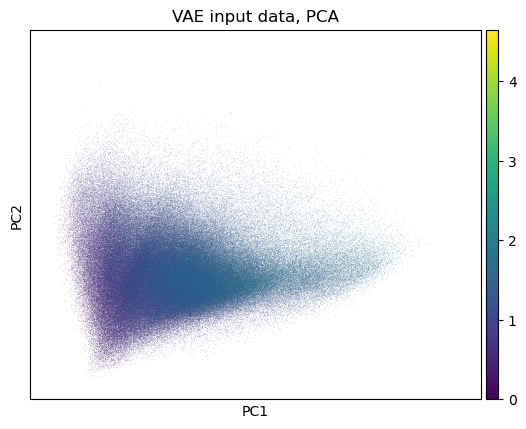

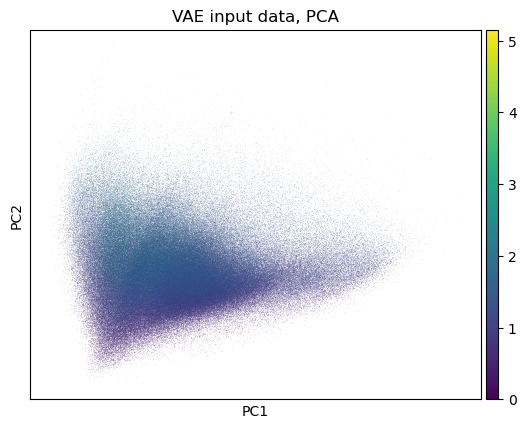

In [25]:
sc.pl.pca(a0, color='0', title='VAE input data, PCA')
sc.pl.pca(a0, color='20', title='VAE input data, PCA')

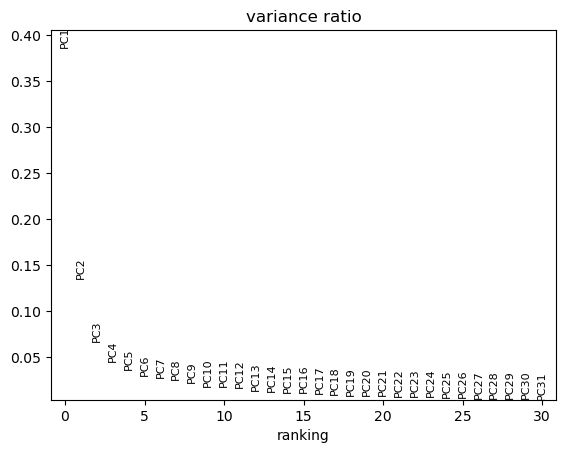

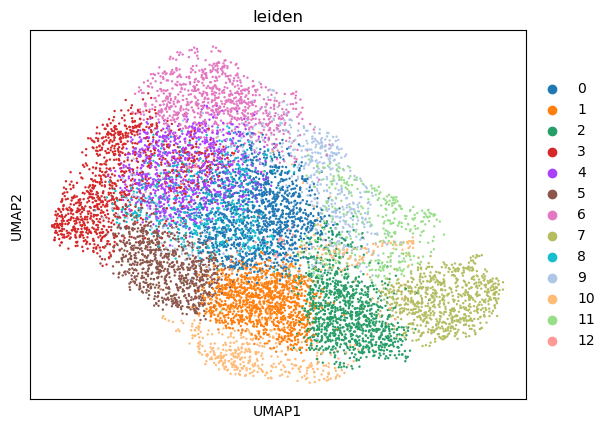

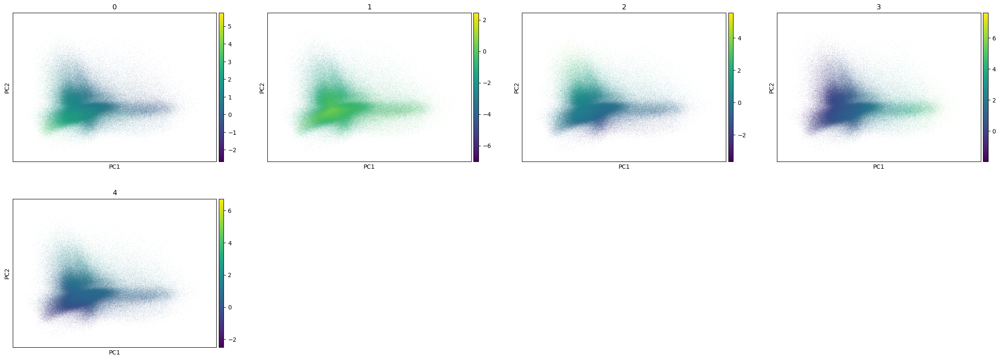

In [26]:
sc.pl.pca_variance_ratio(a0)
# sc.pl.pca_variance_ratio(a0, log=True)
b0 = a0[random_choice, :].copy()
sc.pp.neighbors(b0)
sc.tl.leiden(b0)
sc.tl.umap(b0)
sc.pl.umap(b0, color='leiden')

sc.tl.pca(a1, svd_solver='arpack')
sc.pl.pca(a1, color=['0', '1', '2', '3', '4'])

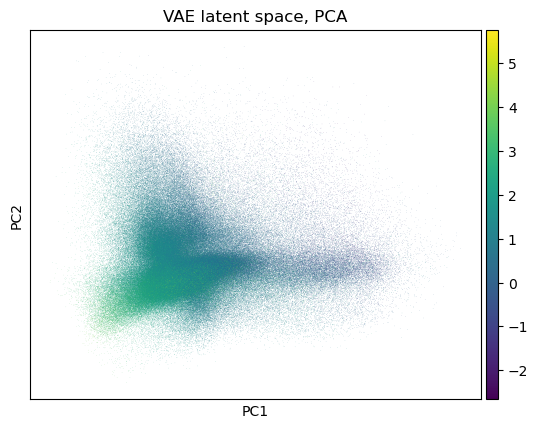

In [27]:
sc.pl.pca(a1, color=['0'], title='VAE latent space, PCA')

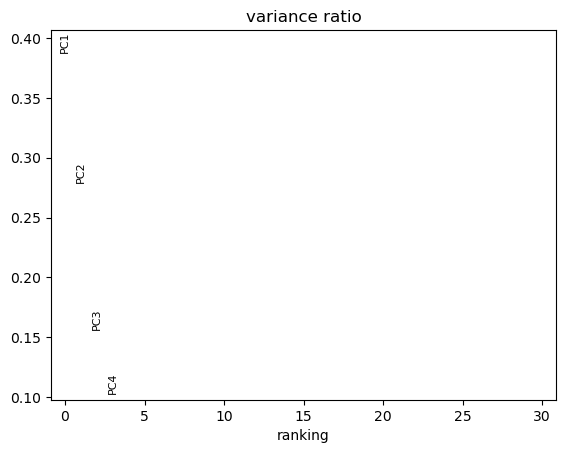

{'params': {'zero_center': True, 'use_highly_variable': False}, 'variance': array([1.30755655, 0.94223395, 0.52585257, 0.34724576]), 'variance_ratio': array([0.38725915, 0.27906152, 0.15574181, 0.10284381])}


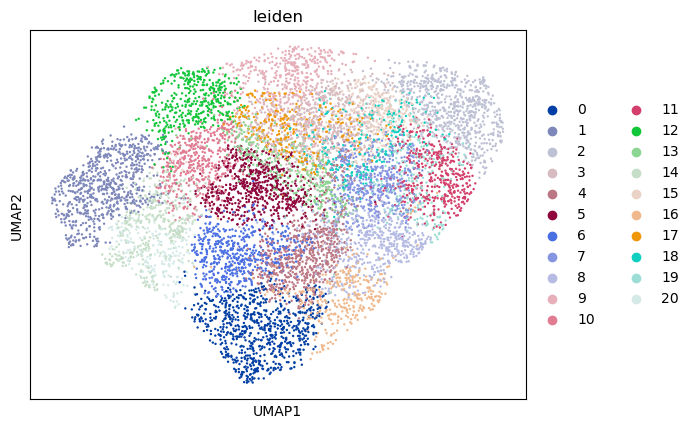

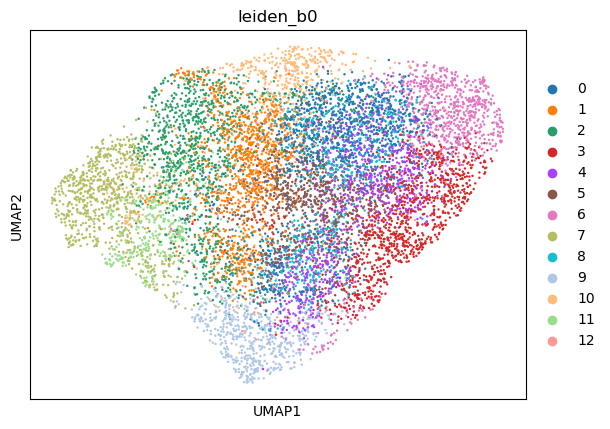

In [28]:
sc.pl.pca_variance_ratio(a1)
print(a1.uns['pca'])
b1 = a1[random_choice, :].copy()
sc.pp.neighbors(b1)
sc.tl.leiden(b1)
sc.tl.umap(b1)
sc.pl.umap(b1, color='leiden')

b1.obs['leiden_b0'] = b0.obs['leiden']
sc.pl.umap(b1, color='leiden_b0')

In [29]:
lr = 0.0014685885989200848
vb = 3.8608662714605464e-08
print(f'{lr:.3e}')
print(f'{vb:.3e}')

1.469e-03
3.861e-08


In [50]:
random_choice = np.random.choice(len(instances[-2].all_original), 10000, replace=False)

(446738, 39)
vae_cell_dataset_expression_LR_VB_S_0.008589699868666383__4.936238801267489e-08__False


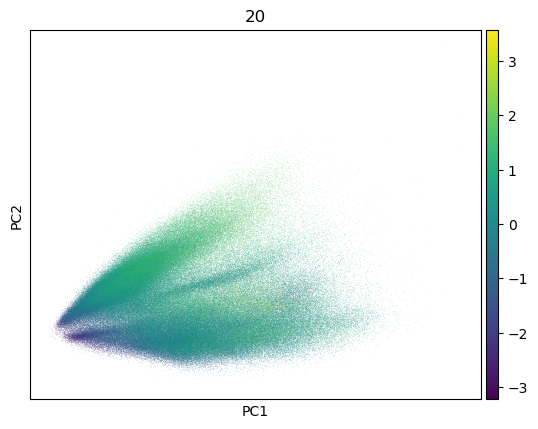

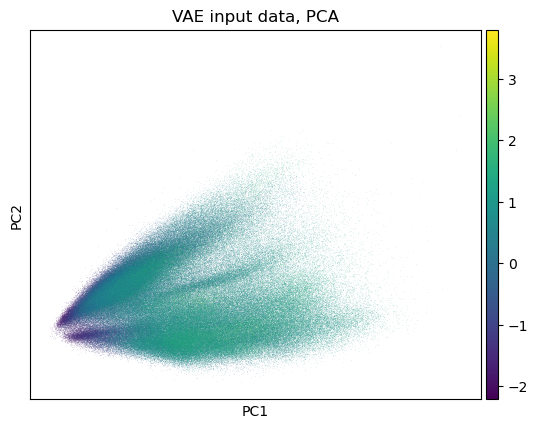

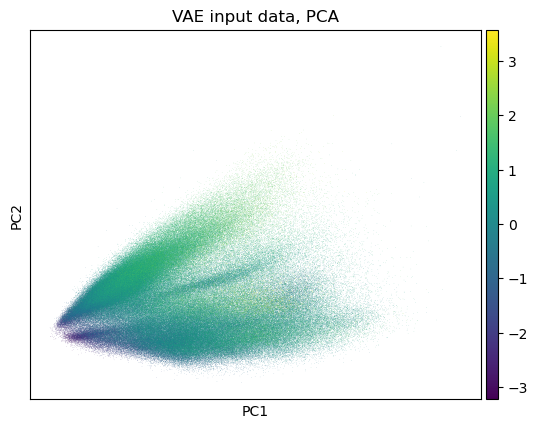

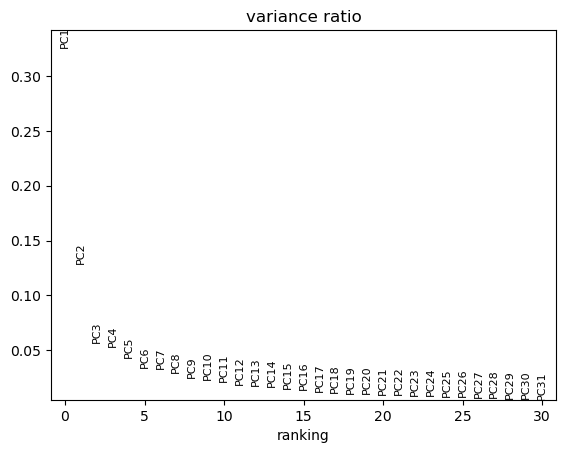

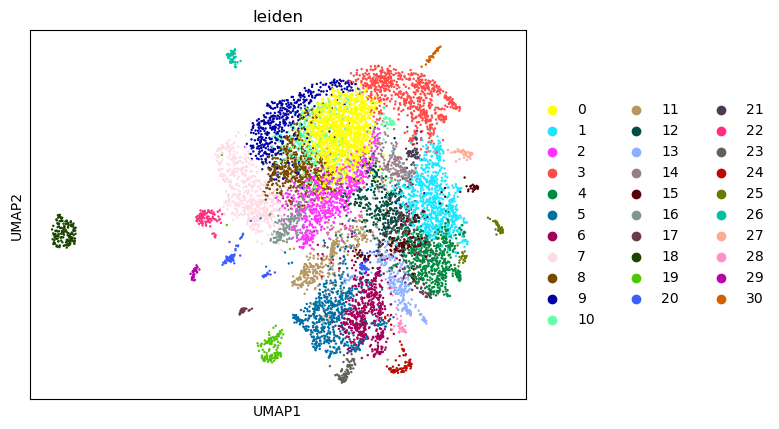

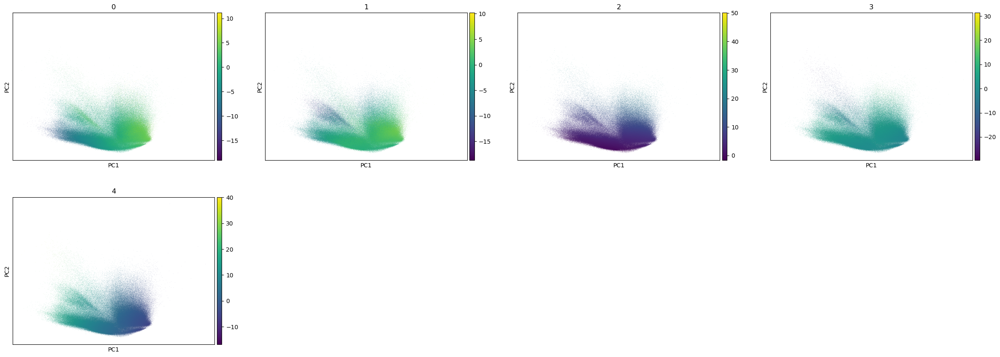

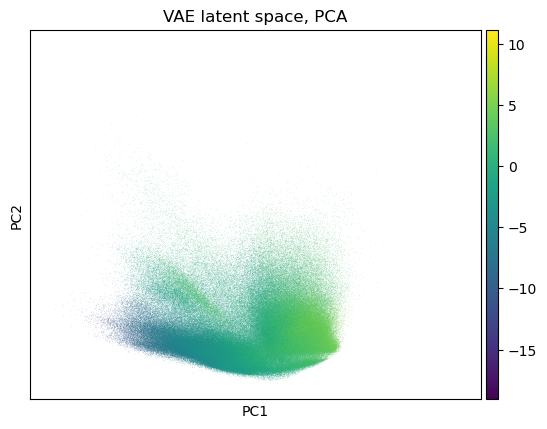

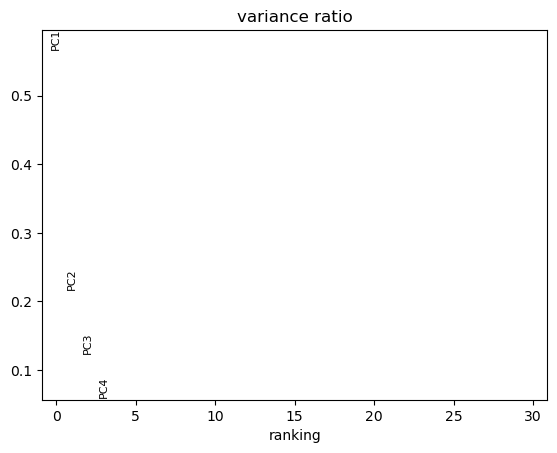

{'params': {'zero_center': True, 'use_highly_variable': False}, 'variance': array([44.26424496, 16.9005097 ,  9.68692542,  4.65714951]), 'variance_ratio': array([0.56731691, 0.21660699, 0.1241534 , 0.0596888 ])}


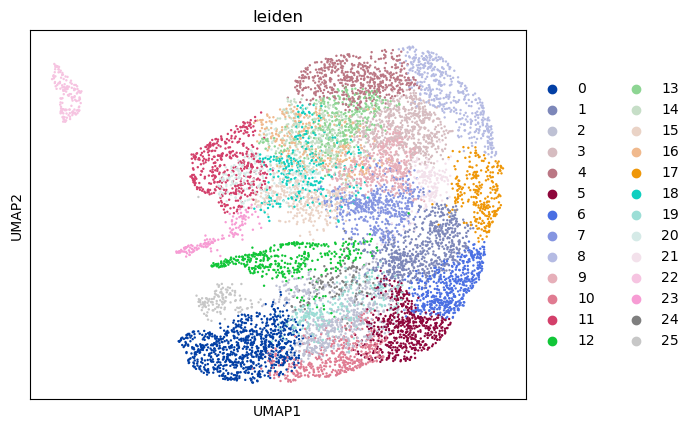

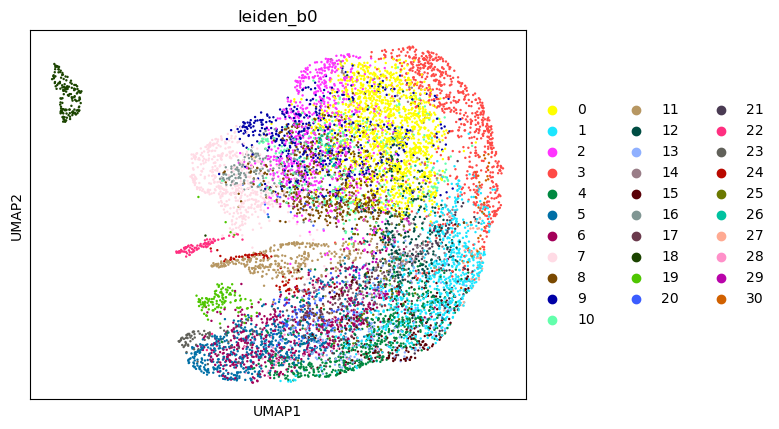

In [51]:
instance = instances[-2]
print(instance.all_original.shape)

print(instance.instance)
a0 = ad.AnnData(instance.all_original)
a1 = ad.AnnData(instance.all_mu)
a2 = ad.AnnData(instance.all_log_var)

sc.tl.pca(a0, svd_solver='arpack')
sc.pl.pca(a0, color='20')
sc.pl.pca(a0, color='0', title='VAE input data, PCA')
sc.pl.pca(a0, color='20', title='VAE input data, PCA')

sc.pl.pca_variance_ratio(a0)
# sc.pl.pca_variance_ratio(a0, log=True)
b0 = a0[random_choice, :].copy()
sc.pp.neighbors(b0)
sc.tl.leiden(b0)
sc.tl.umap(b0)
sc.pl.umap(b0, color='leiden')

sc.tl.pca(a1, svd_solver='arpack')
sc.pl.pca(a1, color=['0', '1', '2', '3', '4'])

sc.pl.pca(a1, color=['0'], title='VAE latent space, PCA')

sc.pl.pca_variance_ratio(a1)
print(a1.uns['pca'])
b1 = a1[random_choice, :].copy()
sc.pp.neighbors(b1)
sc.tl.leiden(b1)
sc.tl.umap(b1)
sc.pl.umap(b1, color='leiden')

b1.obs['leiden_b0'] = b0.obs['leiden']
sc.pl.umap(b1, color='leiden_b0')

(446738, 39)
vae_cell_dataset_expression_LR_VB_S_0.005454608066923681__0.0011442413409550448__False


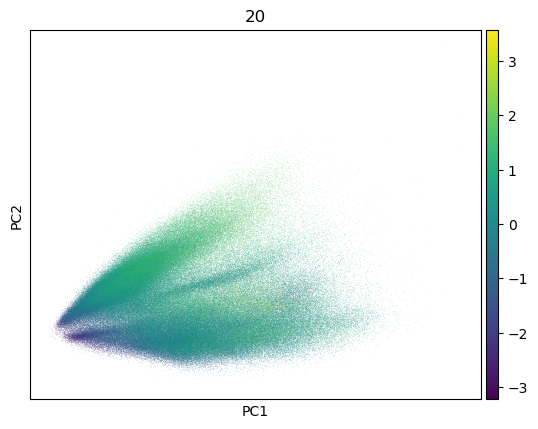

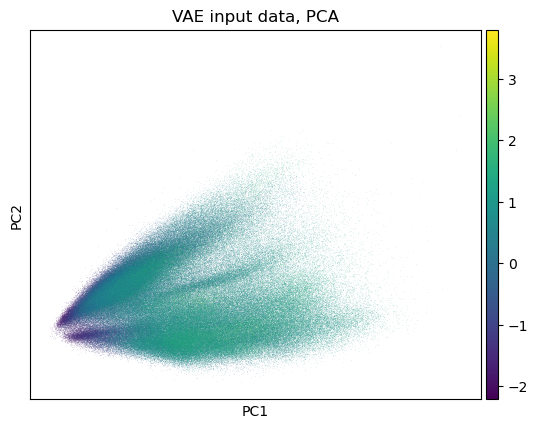

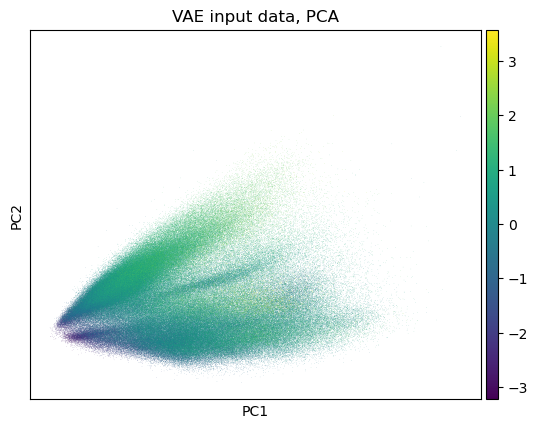

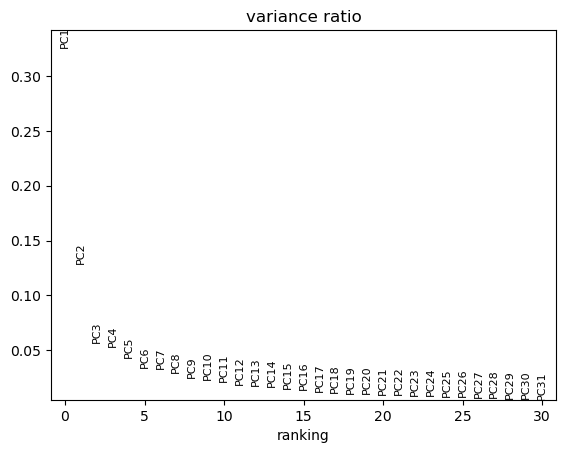

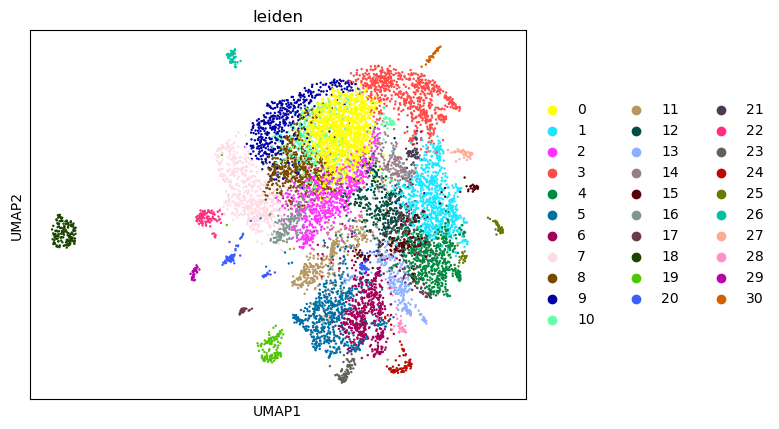

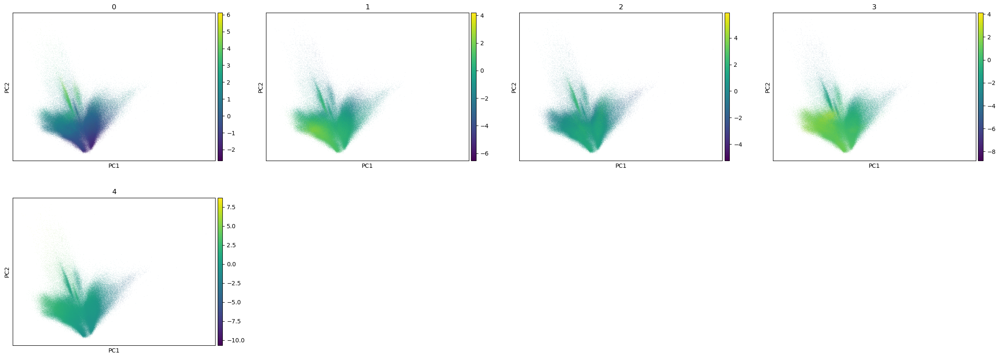

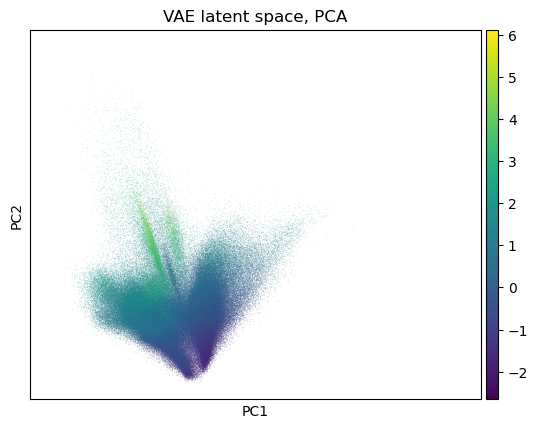

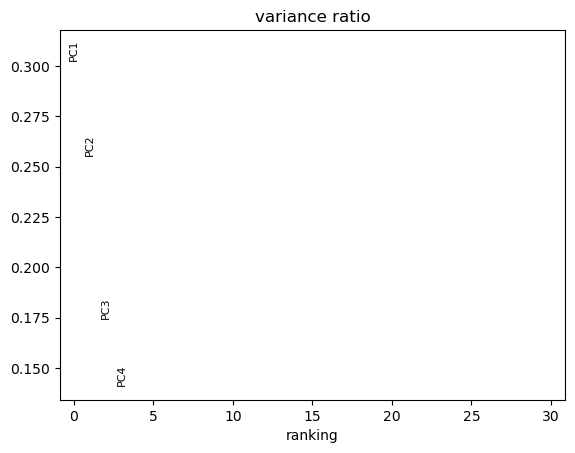

{'params': {'zero_center': True, 'use_highly_variable': False}, 'variance': array([1.60900737, 1.35767115, 0.9285031 , 0.75145835]), 'variance_ratio': array([0.30266608, 0.2553879 , 0.17465824, 0.14135482])}


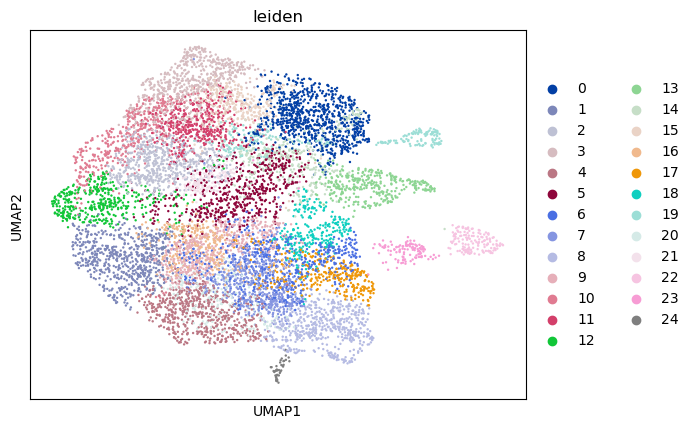

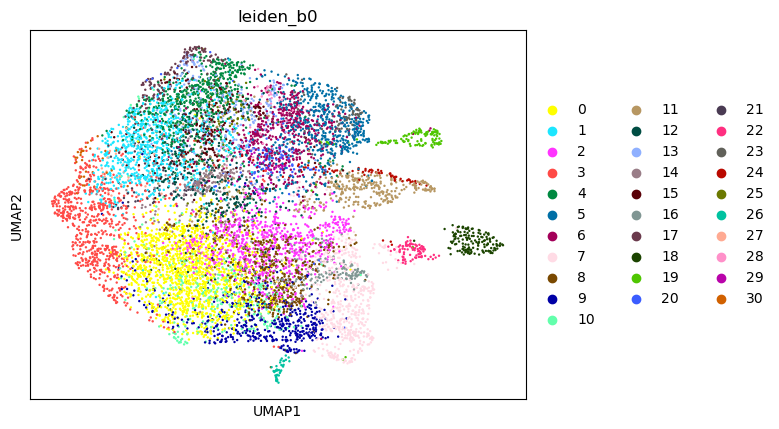

In [52]:
instance = instances[-1]
print(instance.all_original.shape)

print(instance.instance)
a0 = ad.AnnData(instance.all_original)
a1 = ad.AnnData(instance.all_mu)
a2 = ad.AnnData(instance.all_log_var)

sc.tl.pca(a0, svd_solver='arpack')
sc.pl.pca(a0, color='20')
sc.pl.pca(a0, color='0', title='VAE input data, PCA')
sc.pl.pca(a0, color='20', title='VAE input data, PCA')

sc.pl.pca_variance_ratio(a0)
# sc.pl.pca_variance_ratio(a0, log=True)
b0 = a0[random_choice, :].copy()
sc.pp.neighbors(b0)
sc.tl.leiden(b0)
sc.tl.umap(b0)
sc.pl.umap(b0, color='leiden')

sc.tl.pca(a1, svd_solver='arpack')
sc.pl.pca(a1, color=['0', '1', '2', '3', '4'])

sc.pl.pca(a1, color=['0'], title='VAE latent space, PCA')

sc.pl.pca_variance_ratio(a1)
print(a1.uns['pca'])
b1 = a1[random_choice, :].copy()
sc.pp.neighbors(b1)
sc.tl.leiden(b1)
sc.tl.umap(b1)
sc.pl.umap(b1, color='leiden')

b1.obs['leiden_b0'] = b0.obs['leiden']
sc.pl.umap(b1, color='leiden_b0')